In [5]:
import numpy as np
import pandas as pd 
import geopandas as gpd
import matplotlib.pyplot as plt
import osmnx as ox
import networkx as nx
from descartes import PolygonPatch
from shapely.geometry import Point, Polygon, MultiPolygon, LineString
from tqdm.auto import tqdm
import shapely.speedups
shapely.speedups.enable() 
import warnings
warnings.filterwarnings('ignore')

#### Saarbrucken

In [8]:
PLACE_NAME = 'Regionalverband Saarbrücken, Saarland, Germany'

epsg:4326
+proj=utm +zone=32 +ellps=WGS84 +datum=WGS84 +units=m +no_defs +type=crs
<class 'shapely.geometry.polygon.Polygon'>


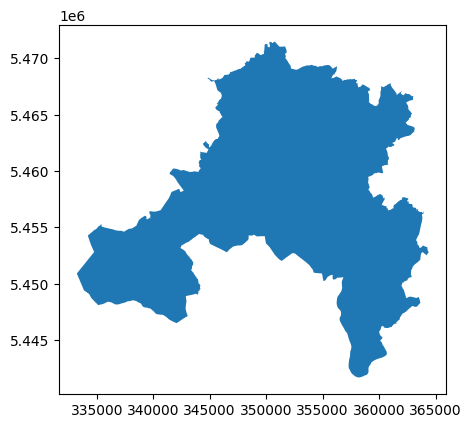

In [9]:
city = ox.geocode_to_gdf(PLACE_NAME)
print(city.crs)
## changing CRS for grid division
city = ox.project_gdf(city) 
print(city.crs)
ax = city.plot()
geometry = city['geometry'].iloc[0]
print(type(geometry))

In [6]:
#save geometry
# city.to_file("berlin.shp")

#### Division into grid

In [10]:
geometry_cut = ox.utils_geo._quadrat_cut_geometry(geometry, quadrat_width=500) #500 Meter grid
print(type(geometry_cut))
polylist = [poly for poly in geometry_cut.geoms]

<class 'shapely.geometry.multipolygon.MultiPolygon'>


In [11]:
print(polylist[4].centroid.coords[:][0])

(333981.1181628195, 5451384.027052464)


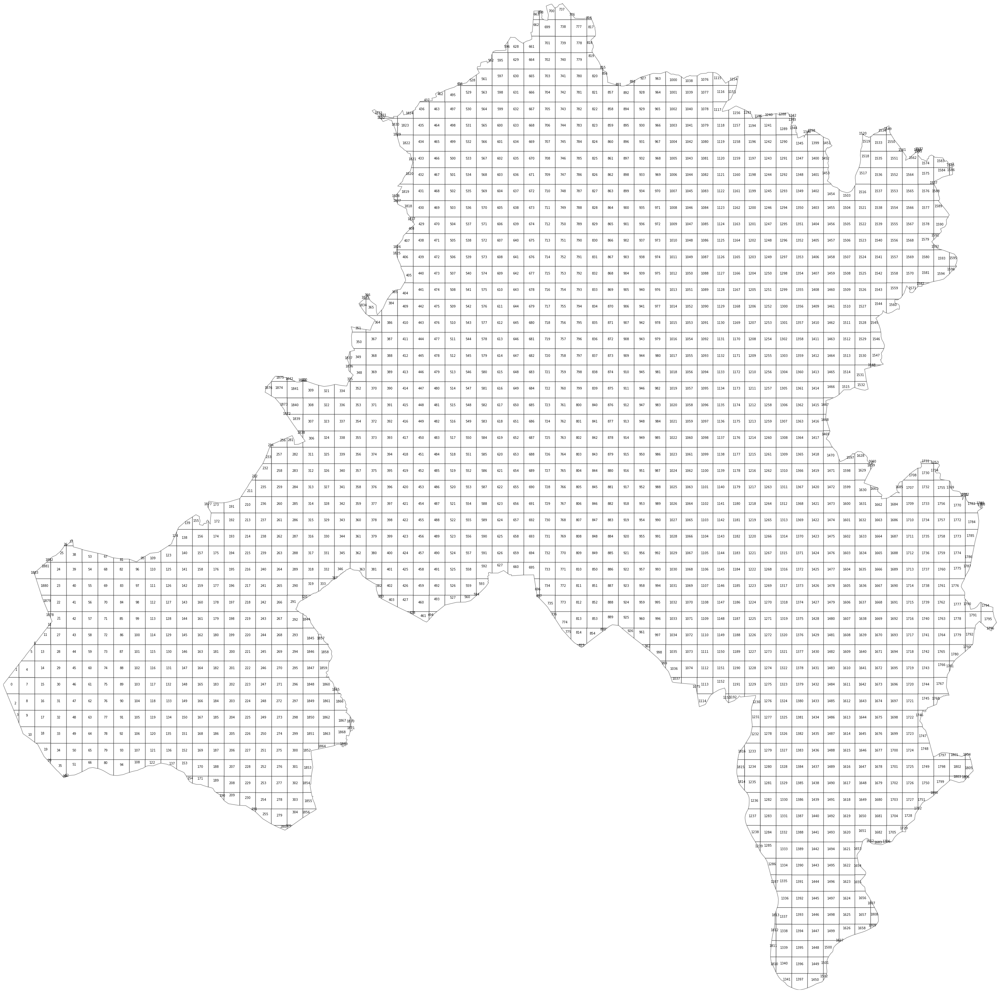

In [12]:
polylist = [poly for poly in geometry_cut.geoms]
# plot city
west, south, east, north = city.unary_union.bounds

fig, ax = plt.subplots(figsize=(40,40))
for polygon, n in zip(geometry_cut.geoms, np.arange(len(polylist))):
    p = polygon.representative_point().coords[:][0]
    patch = PolygonPatch(polygon, fc='#ffffff', ec='#000000', alpha=0.5, zorder=2)
    ax.add_patch(patch)
    plt.annotate(text=n, xy=p, horizontalalignment='center', size=7)
    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

In [13]:
berlin_polyframe = gpd.GeoDataFrame(geometry=polylist)
berlin_polyframe.crs = city.crs
print(berlin_polyframe.crs)
berlin_polyframe.head()

+proj=utm +zone=32 +ellps=WGS84 +datum=WGS84 +units=m +no_defs +type=crs


,geometry
0,"POLYGON ((333235.874 5450921.609, 333239.450 5..."
1,"POLYGON ((333409.424 5451139.393, 333730.461 5..."
2,"POLYGON ((333730.461 5450643.571, 333730.461 5..."
3,"POLYGON ((333730.461 5450147.749, 333730.461 5..."
4,"POLYGON ((333730.461 5451539.630, 333807.132 5..."


(6293878.56314319, 6339180.207535501)

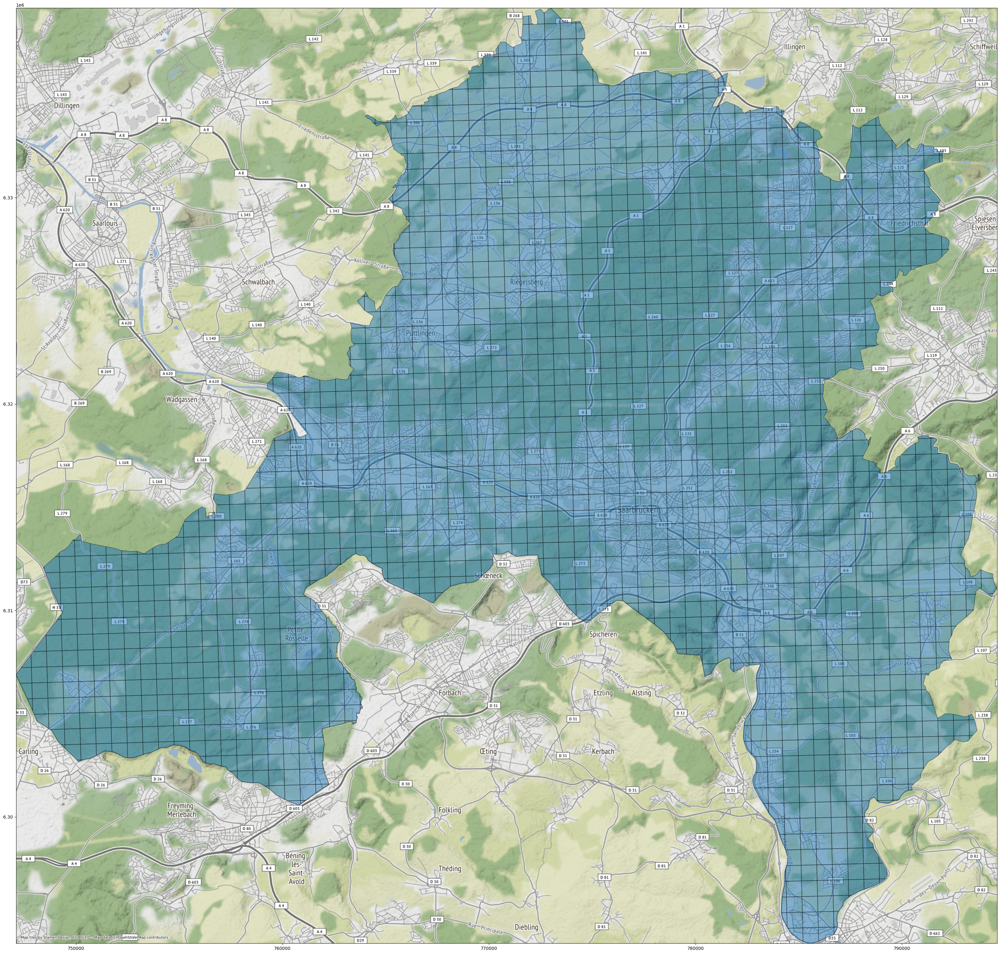

In [14]:
import contextily as ctx
# ctx uses epsg:3857
polyframe_3857 = berlin_polyframe.to_crs(epsg=3857)
west, south, east, north = polyframe_3857.unary_union.bounds

ax = polyframe_3857.plot(figsize=(40,40), alpha=0.5, edgecolor='k')
ctx.add_basemap(ax, zoom=13)
ax.set_xlim(west, east)
ax.set_ylim(south, north)

#### POIs
- Understanding each one of them and making dataset

In [15]:
berlin_polyframe_lat_long = ox.project_gdf(berlin_polyframe, to_latlong=True) #Changing CRS to (Lat, long)
berlin_polyframe_lat_long.head()

,geometry
0,"POLYGON ((6.71128 49.18840, 6.71133 49.18846, ..."
1,"POLYGON ((6.71357 49.19041, 6.71781 49.19409, ..."
2,"POLYGON ((6.71818 49.18604, 6.71838 49.18158, ..."
3,"POLYGON ((6.71838 49.18158, 6.71854 49.17812, ..."
4,"POLYGON ((6.71781 49.19409, 6.71882 49.19497, ..."


#### 1. EV stations

In [16]:
EV_stations = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "charging_station"},
)
EV_stations.head()

amenity authentication:debit_card  \
element_type osmid                                                    
node         2967597755  charging_station                       yes   
             3457200765  charging_station                       NaN   
             3481556531  charging_station                       yes   
             3481556532  charging_station                       yes   
             3481556533  charging_station                       NaN   

                        authentication:membership_card  \
element_type osmid                                       
node         2967597755                            yes   
             3457200765                            yes   
             3481556531                            yes   
             3481556532                            yes   
             3481556533                            NaN   

                        authentication:money_card capacity  fee motorcar  \
element_type osmid                                                         
node         2967597755                       yes        2  yes      yes   
             3457200765                       NaN        2  yes      yes   
             3481556531                       yes        2  yes      yes   
             3481556532                       yes        2  yes      yes   
             3481556533                       NaN        2  NaN      yes   

                        opening_hours                operator  \
element_type osmid                                              
node         2967597755          24/7                 energis   
             3457200765          24/7           Stadtwerke VK   
             3481556531           NaN                 energis   
             3481556532          24/7                 energis   
             3481556533           NaN  Stadtwerke Saarbrücken   

                                         ref  ... charge  \
element_type osmid                            ...          
node         2967597755  BC 4309-4;BC-4310-S  ...    NaN   
             3457200765                  NaN  ...    NaN   
             3481556531                  NaN  ...    NaN   
             3481556532            BC-4592-1  ...    NaN   
             3481556533             F-DB 807  ...    NaN   

                        authentication:short_message motor_vehicle note  \
element_type osmid                                                        
node         2967597755                          NaN           NaN  NaN   
             3457200765                          NaN           NaN  NaN   
             3481556531                          NaN           NaN  NaN   
             3481556532                          NaN           NaN  NaN   
             3481556533                          NaN           NaN  NaN   

                        strapline supervised support man_made brand start_date  
element_type osmid                                                              
node         2967597755       NaN        NaN     NaN      NaN   NaN        NaN  
             3457200765       NaN        NaN     NaN      NaN   NaN        NaN  
             3481556531       NaN        NaN     NaN      NaN   NaN        NaN  
             3481556532       NaN        NaN     NaN      NaN   NaN        NaN  
             3481556533       NaN        NaN     NaN      NaN   NaN        NaN  

[5 rows x 55 columns]

In [17]:
print(type(EV_stations))

<class 'geopandas.geodataframe.GeoDataFrame'>


Text(0.5, 1.0, 'Berlin EV stations')

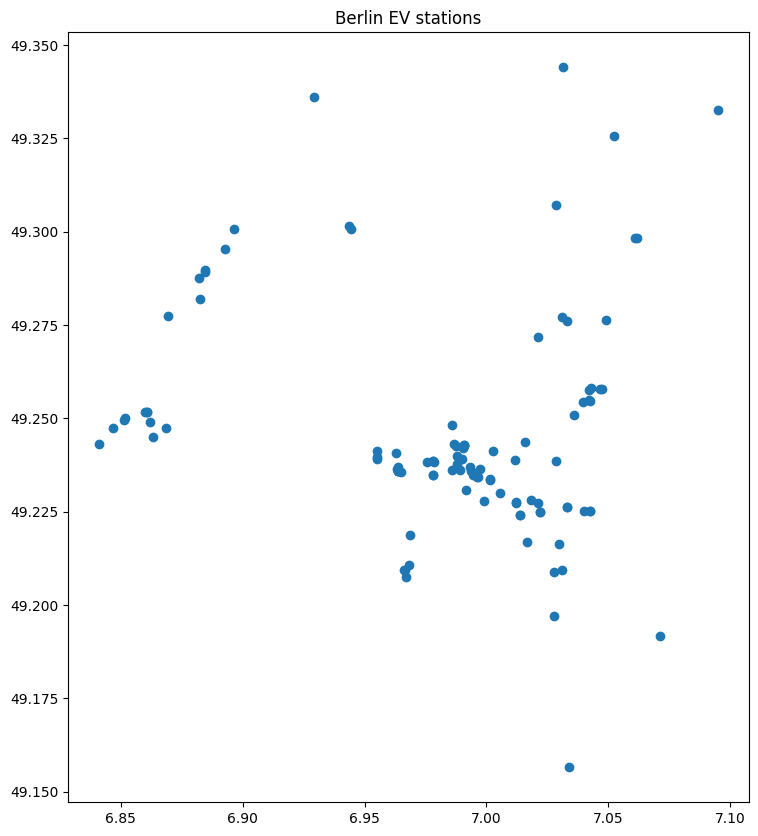

In [18]:
#plot EV stations geo data
EV_stations.plot(figsize=(10,10))
plt.title("Berlin EV stations")

In [19]:
list(EV_stations.columns)

['amenity',
 'authentication:debit_card',
 'authentication:membership_card',
 'authentication:money_card',
 'capacity',
 'fee',
 'motorcar',
 'opening_hours',
 'operator',
 'ref',
 'geometry',
 'authentication:nfc',
 'socket:type2',
 'website',
 'amperage',
 'contact:website',
 'manufacturer',
 'socket:schuko',
 'fixme',
 'operator:wikidata',
 'name',
 'authentication:none',
 'authentication:pin',
 'bicycle',
 'charging_station:type',
 'description',
 'maxstay',
 'payment:coins',
 'scooter',
 'truck',
 'check_date:opening_hours',
 'lit',
 'noname',
 'noref',
 'socket:type2_combo',
 'access',
 'socket:type2:output',
 'authentication:app',
 'voltage',
 'covered',
 'operator:wikipedia',
 'parking:fee',
 'socket:chademo',
 'socket:chademo:output',
 'socket:type2_combo:output',
 'charge',
 'authentication:short_message',
 'motor_vehicle',
 'note',
 'strapline',
 'supervised',
 'support',
 'man_made',
 'brand',
 'start_date']

In [20]:
assert np.sum(EV_stations['amenity'].values == 'charging_station') ==  len(EV_stations) #amenity column
### investigating important columns
EV_stations['geometry'].head() #geometry column

element_type  osmid     
node          2967597755    POINT (7.02125 49.22742)
              3457200765    POINT (6.86006 49.25182)
              3481556531    POINT (7.02968 49.21638)
              3481556532    POINT (7.00162 49.23347)
              3481556533    POINT (6.97822 49.23479)
Name: geometry, dtype: geometry

In [23]:
#check null values out of toital values
print(EV_stations['amperage'].isnull().sum() / len(EV_stations)) #amperage column
print(EV_stations['voltage'].isnull().sum() / len(EV_stations)) #voltage column
print(EV_stations['capacity'].isnull().sum() / len(EV_stations)) #capacity column
print(EV_stations['socket:type2'].isnull().sum() / len(EV_stations)) #socket column
#parking column

0.9433962264150944
0.9433962264150944
0.37735849056603776
0.8962264150943396


In [24]:
#intersection of points and polygons
import shapely.speedups
shapely.speedups.enable() 

masks_EV = []
for i in tqdm(range(0,berlin_polyframe.shape[0])):
    pip_mask = EV_stations.within(berlin_polyframe_lat_long.loc[i, 'geometry']) 
    masks_EV.append(pip_mask)

/tmp/ipykernel_125679/2003839659.py:3: DeprecationWarning: This function has no longer any effect, and will be removed in a future release. Starting with Shapely 2.0, equivalent speedups are always available
  shapely.speedups.enable()
100%|██████████| 1884/1884 [00:00<00:00, 31788.32it/s]


In [25]:
#extract ['amperage', 'voltage', 'amenity', 'capacity'] columns
EV_stations[masks_EV[1438]][['amperage', 'voltage', 'amenity', 'capacity', 'geometry']]

,,amperage,voltage,amenity,capacity,geometry
element_type,osmid,,,,,


In [27]:
EV_stations[masks_EV[125]][['amperage', 'voltage', 'amenity', 'capacity', 'geometry']]

,,amperage,voltage,amenity,capacity,geometry
element_type,osmid,,,,,


In [28]:
# create a new geodataframe with mask EV stations 

EV_stations_masked = gpd.GeoDataFrame()
for i in tqdm(range(0,berlin_polyframe.shape[0])):
    EV_stations_masked = pd.concat([EV_stations_masked, EV_stations[masks_EV[i]][['amperage', 'voltage', 'amenity', 'capacity', 'geometry']]], ignore_index=True)

100%|██████████| 1884/1884 [00:03<00:00, 543.52it/s]


In [29]:
EV_stations[masks_EV[1438]]['amperage'].values.tolist()

[]

In [30]:
berlin_polyframe_lat_long_new = berlin_polyframe_lat_long.copy()
berlin_polyframe_lat_long_new['EV_stations_counts'] = 0
berlin_polyframe_lat_long_new['EV_stations_aperage'] = 0
berlin_polyframe_lat_long_new['EV_stations_voltage'] = 0
berlin_polyframe_lat_long_new['EV_stations_capacity'] = 0
berlin_polyframe_lat_long_new['EV_stations_geomery'] = 0

In [31]:
for i in range(0,berlin_polyframe_lat_long_new.shape[0]):
    berlin_polyframe_lat_long_new.loc[i, 'EV_stations_counts'] = EV_stations[masks_EV[i]].shape[0]
    berlin_polyframe_lat_long_new.loc[i, 'EV_stations_aperage'] = str(EV_stations[masks_EV[i]][['amperage']].values.tolist())
    berlin_polyframe_lat_long_new.loc[i, 'EV_stations_voltage'] = str(EV_stations[masks_EV[i]][['voltage']].values.tolist())
    berlin_polyframe_lat_long_new.loc[i, 'EV_stations_capacity'] = str(EV_stations[masks_EV[i]][['capacity']].values.tolist())
    berlin_polyframe_lat_long_new.loc[i, 'EV_stations_geomery'] = str(EV_stations[masks_EV[i]][['geometry']].values.tolist())

### Population data visualize and add to each grid

In [32]:
#### Extract population data
df_pop = pd.read_csv("//home/akansh-i2sc/Downloads/Compressed/population_deu_2019-07-01.csv")
gdf = gpd.GeoDataFrame(df_pop, geometry=gpd.points_from_xy(df_pop.Lon, df_pop.Lat))

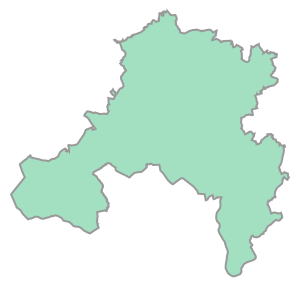

In [33]:
#extract population data for berlin
city.geometry[0]


In [34]:
# change crs to lat long
city_lat_long = ox.project_gdf(city, to_latlong=True)
pip_mask = gdf.within(city_lat_long.loc[0, 'geometry']) 

In [35]:
berlin_pop_gdf = gdf.loc[pip_mask]

<Axes: >

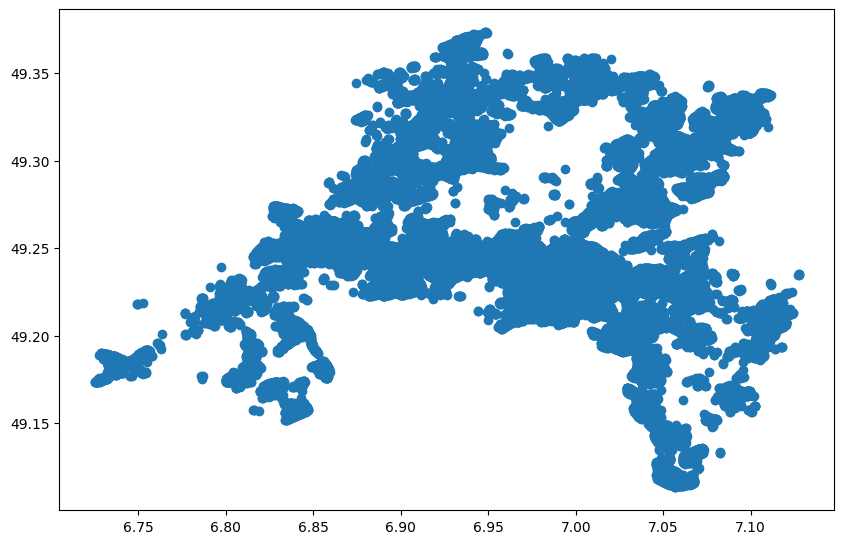

In [36]:
#plot population data with cmap
berlin_pop_gdf.plot(figsize=(10,10))

In [37]:
# population for each grid
masks_pop = []
for i in tqdm(range(0,berlin_polyframe_lat_long.shape[0])):
    pip_mask = berlin_pop_gdf.within(berlin_polyframe_lat_long.loc[i, 'geometry']) 
    masks_pop.append(pip_mask)

100%|██████████| 1884/1884 [00:02<00:00, 655.94it/s]


In [38]:
pop_grid = []
for i in range(0,berlin_polyframe_lat_long.shape[0]):
    pop_grid.append(berlin_pop_gdf.loc[masks_pop[i]].Population.mean())

In [39]:
pop_grid = np.nan_to_num(pop_grid)

In [40]:
berlin_polyframe_lat_long_new['population'] = pop_grid
berlin_polyframe_lat_long_new.head()

,geometry,EV_stations_counts,EV_stations_aperage,EV_stations_voltage,EV_stations_capacity,EV_stations_geomery,population
0,"POLYGON ((6.71128 49.18840, 6.71133 49.18846, ...",0,[],[],[],[],0.0
1,"POLYGON ((6.71357 49.19041, 6.71781 49.19409, ...",0,[],[],[],[],0.0
2,"POLYGON ((6.71818 49.18604, 6.71838 49.18158, ...",0,[],[],[],[],0.0
3,"POLYGON ((6.71838 49.18158, 6.71854 49.17812, ...",0,[],[],[],[],0.0
4,"POLYGON ((6.71781 49.19409, 6.71882 49.19497, ...",0,[],[],[],[],0.0


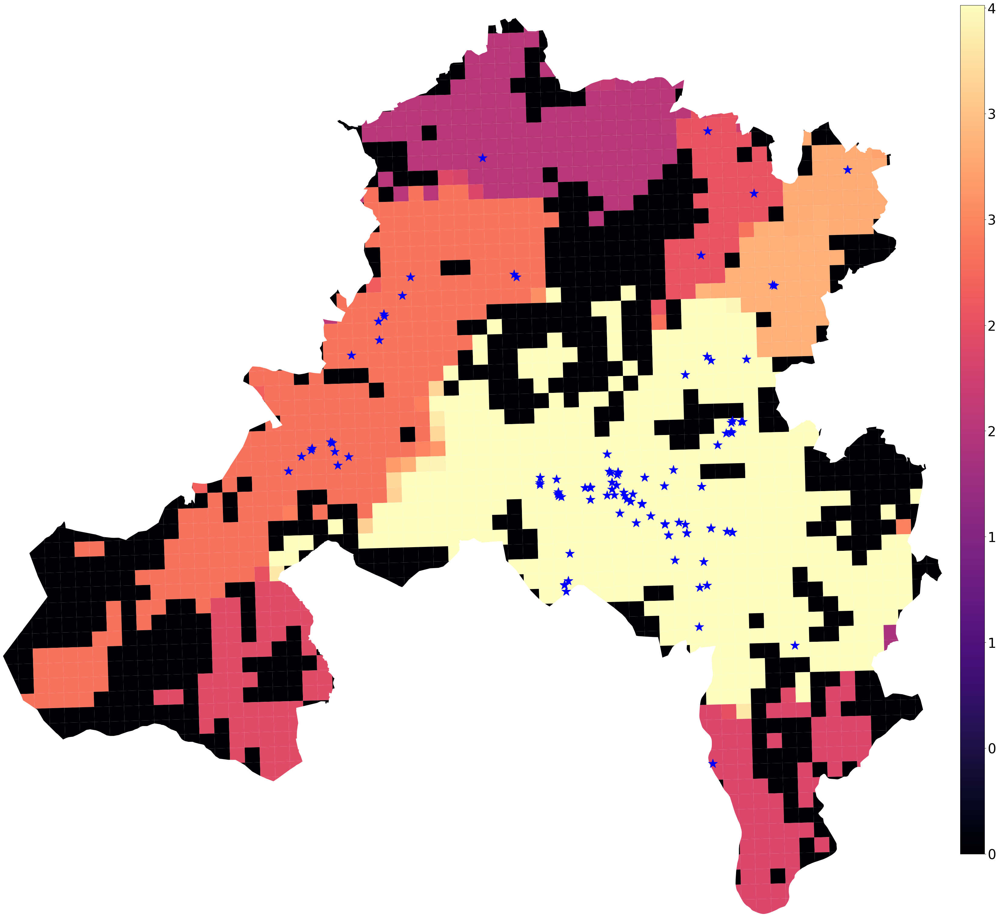

In [51]:
plt.rcParams.update({'font.size':32})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

fig, ax = plt.subplots(figsize=(40,40))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'population', legend=False, cmap='magma')
#plot EV stations on top of grid with * symbol
EV_stations_masked.plot(ax=ax, color='blue', marker='*', markersize=500)


cbax = fig.add_axes([0.915, 0.175, 0.02, 0.7])

sm = plt.cm.ScalarMappable(cmap='magma', \
                          norm = plt.Normalize(vmin=min(berlin_polyframe_lat_long_new.population), vmax=max(berlin_polyframe_lat_long_new.population)))

sm._A = []

# draw colormap into cbax

fig.colorbar(sm, cax=cbax, format="%d")

ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()